In [1]:
import argparse
import time
import pdb

from anndata import AnnData
from sklearn.preprocessing import LabelEncoder
from torch.utils.data import DataLoader

from data import DatasetWithConfounder
from models import BatchDecoder
from models import HilbertSchmidtAE
from utils import configure_logging
from utils import embed_data, train
from utils import load_data
from utils import set_seeds

from desc_ethan import desc
import scvi
import shutil
from pathlib import Path

from utils import silhouette
from tqdm import tqdm
import pandas as pd
import numpy as np

from utils import ebm, knn_purity

configure_logging()
set_seeds(12345)

In [2]:
import matplotlib

adata = load_data("pancreas_generalization", normalized=True)

adata.obs["cell_type"] = adata.obs["cell_type"].astype("category")
adata.obs["study"] = adata.obs["study"].astype("category")

pancreas_study_cmap = matplotlib.cm.get_cmap("Dark2")
pancreas_study_cmap = [
    pancreas_study_cmap(0),
    pancreas_study_cmap(6),
    pancreas_study_cmap(4),
    pancreas_study_cmap(7),
    pancreas_study_cmap(5),
]

cell_cmap = matplotlib.cm.get_cmap("tab20")

pancreas_cell_cmap_map = {}
for i, cell_type in enumerate(adata.obs["cell_type"].unique()):
    pancreas_cell_cmap_map[cell_type] = cell_cmap(i)
    
pancreas_study_cmap_map = {}
for i, study in enumerate(adata.obs["study"].unique()):
    pancreas_study_cmap_map[study]= pancreas_study_cmap[i]
    
study_cmaps = {}
cell_type_cmaps = {}

study_cmaps["pancreas_generalization"] = pancreas_study_cmap_map
cell_type_cmaps["pancreas_generalization"] = pancreas_cell_cmap_map

adata = load_data("pbmc_generalization", normalized=True)

cell_cmap = matplotlib.cm.get_cmap("tab10_r")
pbmc_study_cmap = matplotlib.cm.get_cmap("Paired_r")

pbmc_cell_cmap_map = {}
for i, cell_type in enumerate(adata.obs["cell_type"].unique()):
    pbmc_cell_cmap_map[cell_type] = cell_cmap(i)

pbmc_study_cmap_map = {}
for i, study in enumerate(adata.obs["study"].unique()):
    pbmc_study_cmap_map[study]= pbmc_study_cmap(i)
pbmc_study_cmap_map['10x Chromium (v2) B'] = pbmc_study_cmap(11)
pbmc_study_cmap_map['Drop-seq'] = pbmc_study_cmap(10)

study_cmaps["pbmc_generalization"] = pbmc_study_cmap_map
cell_type_cmaps["pbmc_generalization"] = pbmc_cell_cmap_map

In [ ]:
methods = ['hd-md_{}'.format(fraction) for fraction in [1, 5, 10, 20, 50, 100]]

In [272]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import adjusted_rand_score
import numpy as np
import scanpy as sc
import pandas as pd
from tqdm import tqdm
from utils import load_results
from scipy.stats import sem

resolutions = [0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]

scores = np.zeros((len(resolutions), 6))
errors = np.zeros((len(resolutions), 6))
method_list = []
num_iterations = 5

scores = np.zeros((6))
for idx in tqdm(range(1,6)):
    results = load_results(method, 'pbmc_generalization/subsampling/', idx+1)
    sc.pp.neighbors(results)
    
    score_max = -1
    for j, resolution in enumerate(resolutions):
        sc.tl.leiden(results, resolution=resolution, random_state=42)
        score = adjusted_rand_score(results.obs['leiden'], LabelEncoder().fit_transform(results.obs['cell_type']))
        if score > score_max:
            score_max = score
    scores[idx-1] = score_max

100%|██████████| 5/5 [02:28<00:00, 29.73s/it]


In [273]:
import pickle
scores_test = pickle.load(open("scores", "rb"))

In [274]:
scores_test

,mnnCorrect,seurat,harmony,conos,saucie,desc,scAlign,scvi,hd-md,hd-md_generalization
0,0.285123,0.208372,0.291829,0.171308,0.158596,0.437277,0.273704,0.564517,0.590062,0.592674
1,0.266158,0.202542,0.250978,0.150583,0.141310,0.421297,0.264874,0.516213,0.586272,0.582159
2,0.270368,0.200882,0.237652,0.146156,0.128836,0.412900,0.258046,0.455302,0.540725,0.526963
3,0.233327,0.192915,0.197049,0.123530,0.116953,0.394699,0.205298,0.438182,0.506782,0.527888
4,0.214501,0.186026,0.200837,0.120922,0.109794,0.376183,0.201448,0.379215,0.483915,0.480442
5,0.197375,0.182832,0.184826,0.098410,0.102278,0.296433,0.175721,0.349627,0.476252,0.474827
6,0.192686,0.162039,0.187035,0.099514,0.095113,0.284345,0.168863,0.327614,0.452835,0.466514


In [275]:
scores[5] = max(scores_test['hd-md_generalization'])

In [276]:
scores

array([0.58067441, 0.56138639, 0.58309749, 0.58031807, 0.60002859,
       0.59267434])

In [278]:
from sklearn.metrics import silhouette_samples
from utils import entropy_batch_mixing
from utils import load_results
from tqdm import tqdm

method = 'hd-md'
silhouette_scores = []
for idx in tqdm(range(1,6)):
    results = load_results(method, 'pbmc_generalization/subsampling', idx+1)


    sc.pp.neighbors(results)
    sc.tl.umap(results)
    labels = LabelEncoder().fit_transform(results.obs['cell_type'].to_numpy())
    silhouette_scores.append(silhouette_samples(results.obsm['X_umap'], labels, n_jobs=-1))

100%|██████████| 5/5 [03:03<00:00, 36.72s/it]


In [279]:
silhouette_test = pickle.load(open("silhouette_df", "rb"))

In [280]:
silhouette_scores.append(silhouette_test[silhouette_test['Method'] == 'HD-AE*']['Score'].values)

In [281]:
silhouette_df = pd.DataFrame({ 
    "Score":np.concatenate(silhouette_scores),
    "Method": np.concatenate([np.repeat(i+2, len(silhouette_scores[i])) for i in range(6)]),
    "Dataset": np.repeat("PBMC", len(np.concatenate(silhouette_scores)))
})

In [282]:
method = 'hd-md'

In [300]:
from scipy.stats import sem
from utils import load_results, entropy_batch_mixing

ebm_scores = np.zeros((6))

num_iterations = 5
for idx in tqdm(range(1,6)):
    results = load_results(method, 'pbmc_generalization/subsampling', idx+1)
    ebm = entropy_batch_mixing(
        results.X,
        results.obs.study,
        n_neighbors=50,
        n_pools=50,
        n_samples_per_pool=100
    )
    ebm_scores[idx-1] = ebm

100%|██████████| 5/5 [02:52<00:00, 34.54s/it]


In [301]:
ebm_scores

array([1.24376034, 1.32521809, 1.44208643, 1.39957453, 1.39737949,
       0.        ])

In [ ]:
purity_scores = np.zeros((6))

for idx in tqdm(range(1,6)):
    results = load_results(method, 'pbmc_generalization/subsampling', idx+1)
    purity = knn_purity(
        results,
        'pbmc_generalization',
        'study',
        method
    )
    purity_scores[idx-1] = purity


  0%|          | 0/5 [00:00<?, ?it/s]/homes/gws/ewein/miniconda3/envs/batch_effects/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/homes/gws/ewein/miniconda3/envs/batch_effects/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/homes/gws/ewein/miniconda3/envs/batch_effects/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/homes/gws/ewein/miniconda3/envs/batch_effects/lib/python3.8/site-packages/pandas/core/arrays/categ

In [ ]:
from sklearn.preprocessing import MinMaxScaler

ebm_test = np.load("ebm_scores.npy")
ebm_scores[5] = ebm_test.mean(axis=1)[-1]
scaler = MinMaxScaler().fit(ebm_test.mean(axis=1).reshape(-1, 1))
ebm_scores = scaler.transform(ebm_scores.reshape(-1, 1))

In [ ]:
ebm_test.mean(axis=1)[-1]

In [ ]:
purity_test = np.load("purity_scores.npy")
purity_scores[5] = purity_test.mean(axis=1)[-1]
scaler = MinMaxScaler().fit(purity_test.mean(axis=1).reshape(-1, 1))
purity_scores = scaler.transform(purity_scores.reshape(-1, 1))

In [ ]:
purity_scores

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set()
%matplotlib inline

fig = plt.figure(figsize=(33, 15))
ax1 = fig.add_subplot(2, 12, (1, 4))
ax2 = fig.add_subplot(2, 12, (5, 8))
ax3 = fig.add_subplot(2, 12, (9, 12))
ax4 = fig.add_subplot(2, 12, (13, 16))
ax5 = fig.add_subplot(2, 12, (17, 24))

fontsize=36
ax1.plot([2,3,4,5,6,7], ebm_scores, lw=5)
ax1.set_xlabel("Number of training batches", fontsize=fontsize)
ax1.set_title("EBM", fontsize=fontsize)
ax1.set_ylim(0, 1)

ax2.plot([2,3,4,5,6,7], purity_scores, lw=5)
ax2.set_xlabel("Number of training batches", fontsize=fontsize)
ax2.set_title("Purity", fontsize=fontsize)
ax2.set_ylim(0, 1)

ax3.plot([2,3,4,5,6,7], ebm_scores + purity_scores, lw=5)
ax3.set_xlabel("Number of training batches", fontsize=fontsize)
ax3.set_title("EBM + Purity", fontsize=fontsize)

ax4.plot([2,3,4,5,6,7], scores, lw=5)
ax4.set_xlabel("Number of training batches", fontsize=fontsize)
ax4.set_title("ARI", fontsize=fontsize)
ax4.set_ylim(0, 1)

ax5 = sns.boxplot(
    x="Method",
    y="Score",
    data=silhouette_df,
    color = sns.color_palette()[0]
)

ax5.tick_params(axis='both', which='major', labelsize=fontsize)
ax5.legend(bbox_to_anchor=(1.05, 1.025), loc='upper left', fontsize=fontsize)
ax5.set_ylabel("Silhouette Score", fontsize=fontsize)
ax5.set_xlabel("Number of training batches", fontsize=fontsize)

labelsize=24

ax1.yaxis.set_tick_params(labelsize=labelsize)
ax1.xaxis.set_tick_params(labelsize=labelsize)

ax2.yaxis.set_tick_params(labelsize=labelsize)
ax2.xaxis.set_tick_params(labelsize=labelsize)

ax3.yaxis.set_tick_params(labelsize=labelsize)
ax3.xaxis.set_tick_params(labelsize=labelsize)

ax4.yaxis.set_tick_params(labelsize=labelsize)
ax4.xaxis.set_tick_params(labelsize=labelsize)

ax5.yaxis.set_tick_params(labelsize=labelsize)
ax5.xaxis.set_tick_params(labelsize=labelsize)

plt.tight_layout(w_pad=5, h_pad=5)

In [271]:
purity_test = np.load("purity_scores.npy")

In [ ]:
purity_test

In [ ]:
def plot_results(idx, dataset, keys, frameon=False, title=None, legend_loc='right margin'):
    results_adata = load_results('hd-md', dataset+"/subsampling", idx)
    
    set_seeds()
    sc.set_figure_params(dpi=200)
    
    sc.pp.neighbors(results_adata)
    sc.tl.umap(results_adata, random_state=42)

    study_cmap_map = study_cmaps[dataset]
    cell_cmap_map = cell_type_cmaps[dataset]
    
    results_adata.obs["study"] = results_adata.obs["study"].astype("category")
    results_adata.obs["cell_type"] = results_adata.obs["cell_type"].astype("category")
    
    results_adata.uns["study_colors"] = [study_cmap_map[study] for study in results_adata.obs["study"].cat.categories]
    results_adata.uns["cell_type_colors"] = [cell_cmap_map[cell_type] for cell_type in
                                             results_adata.obs["cell_type"].cat.categories]

    for key in keys:
        sc.pl.umap(results_adata, color=key, frameon=frameon, legend_loc=legend_loc, title=title)

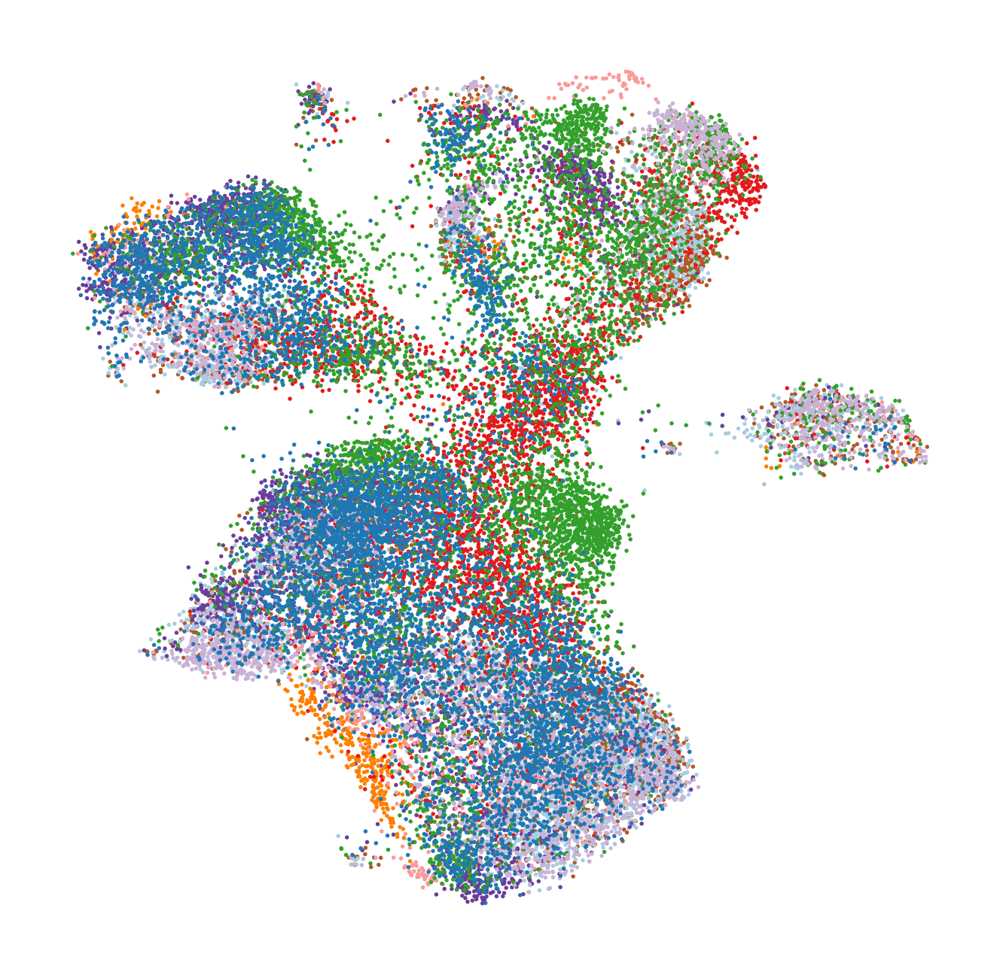

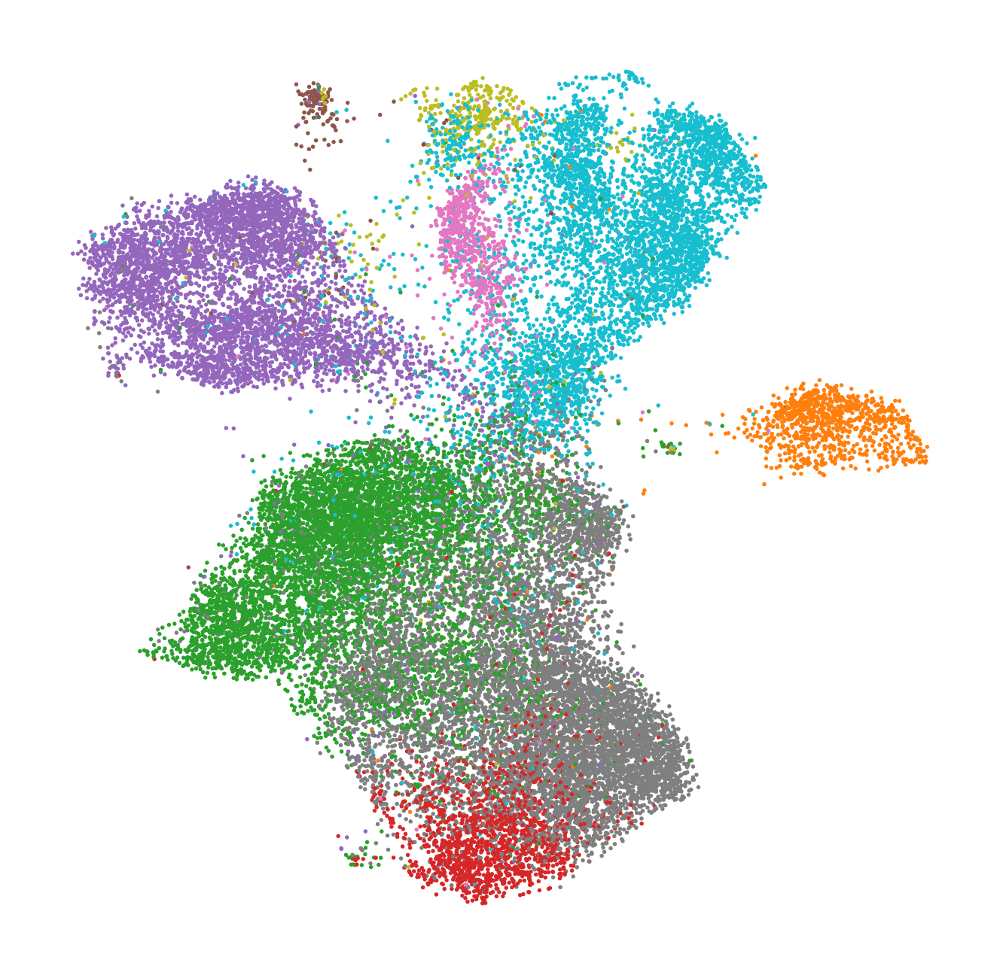

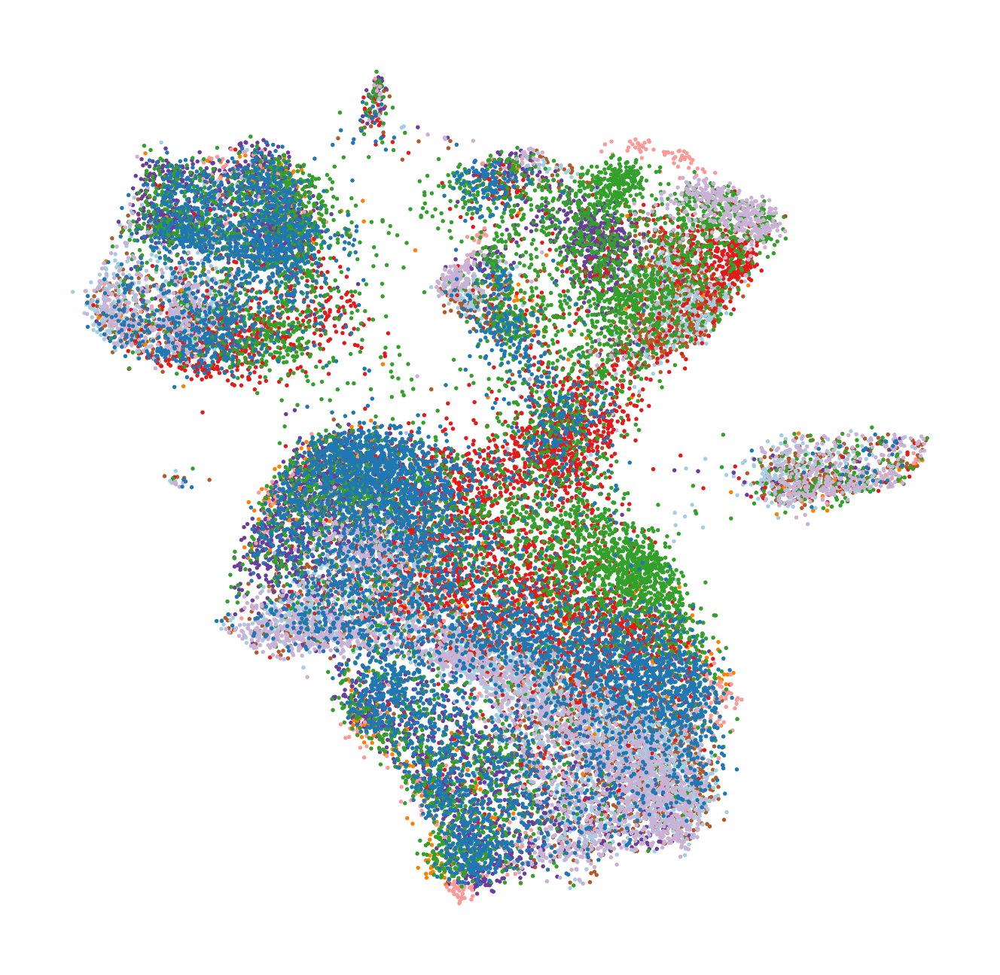

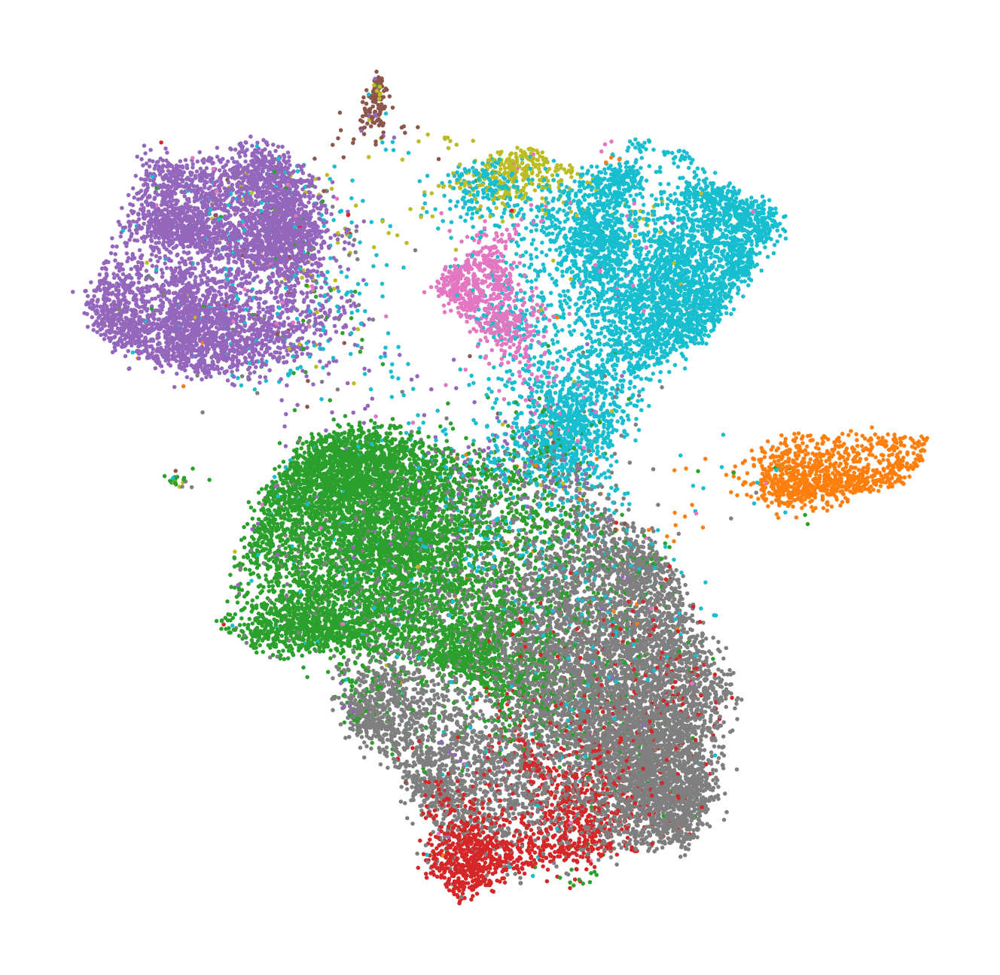

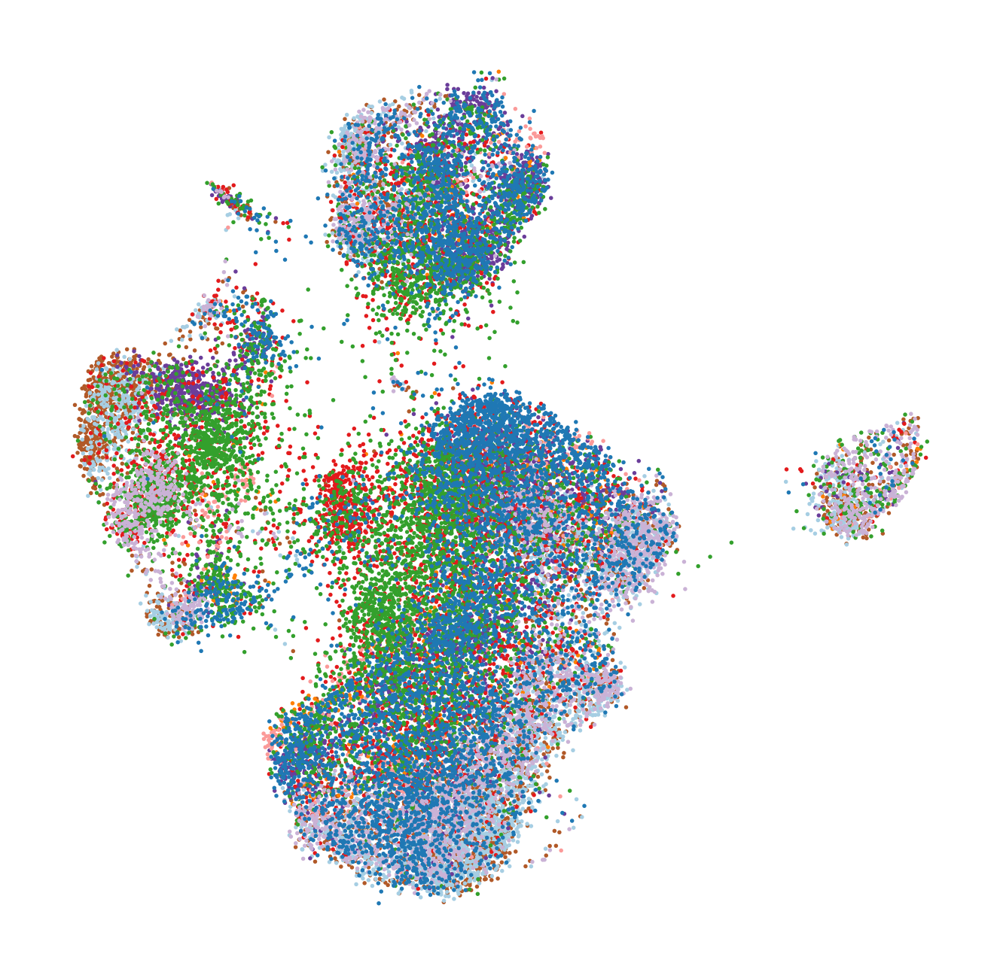

...

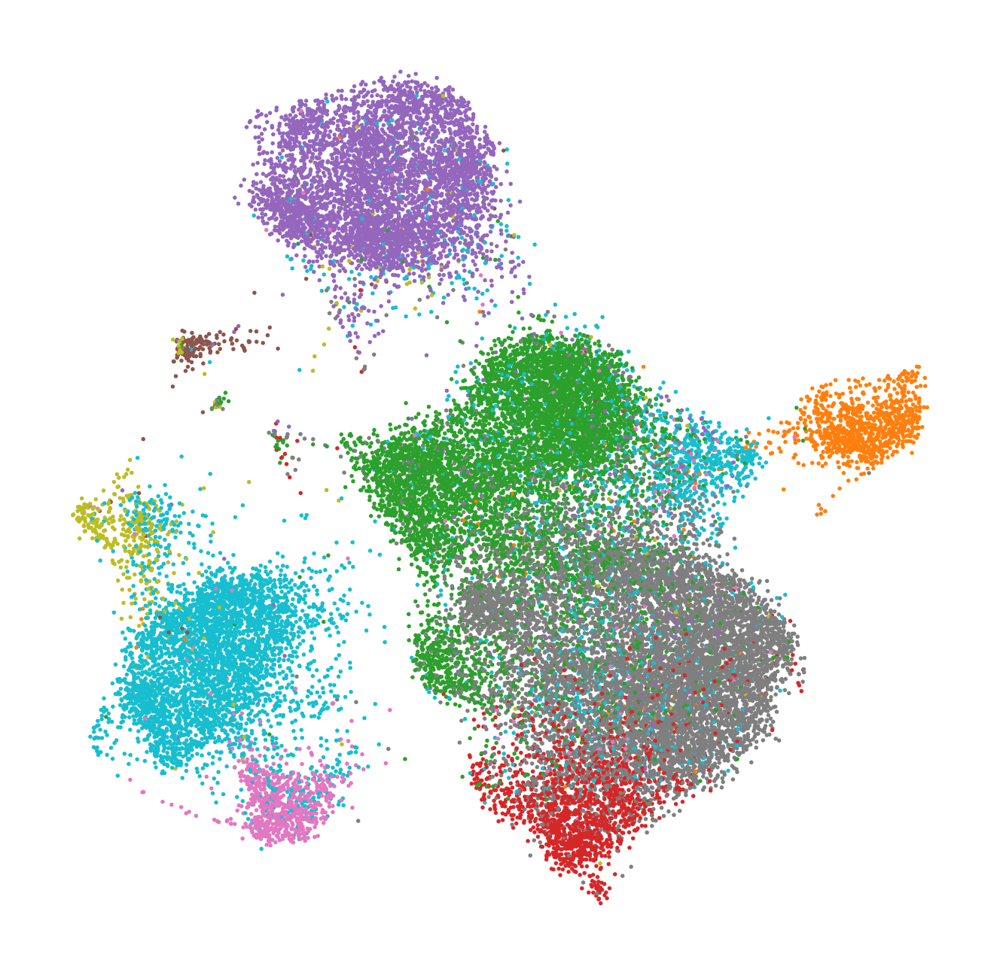

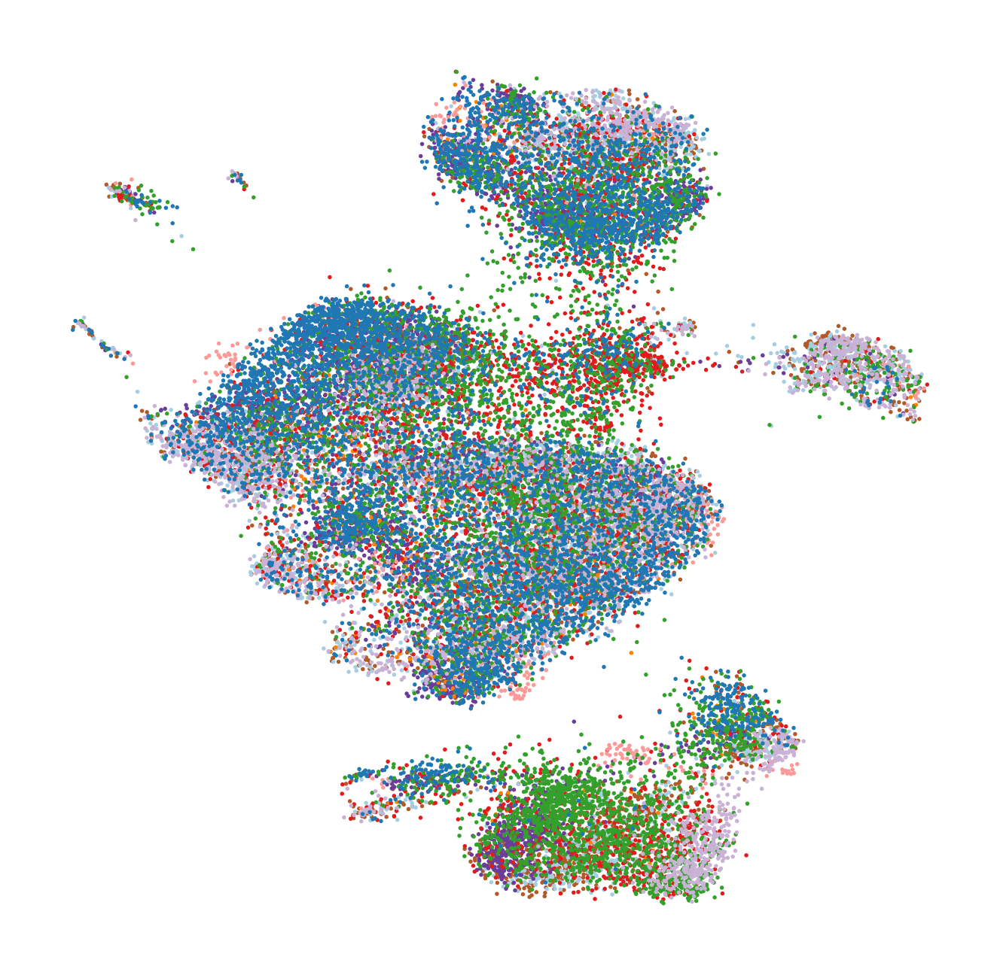

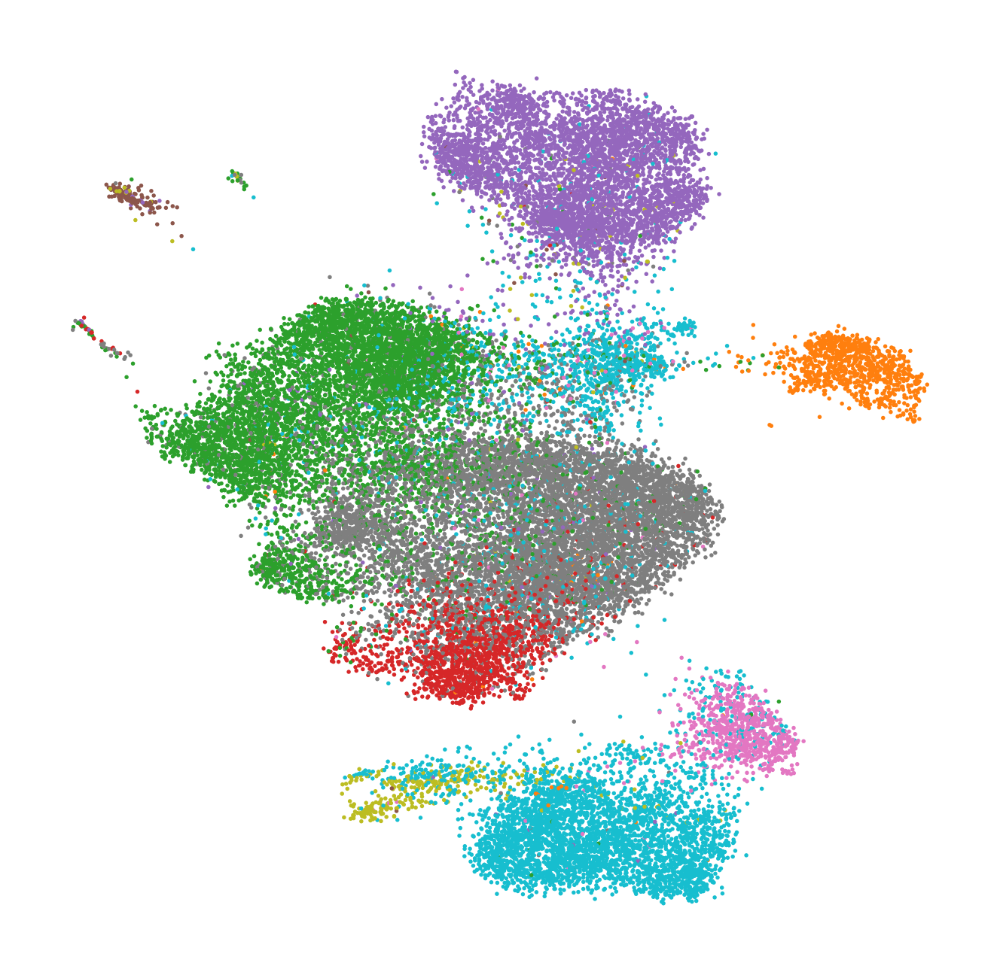

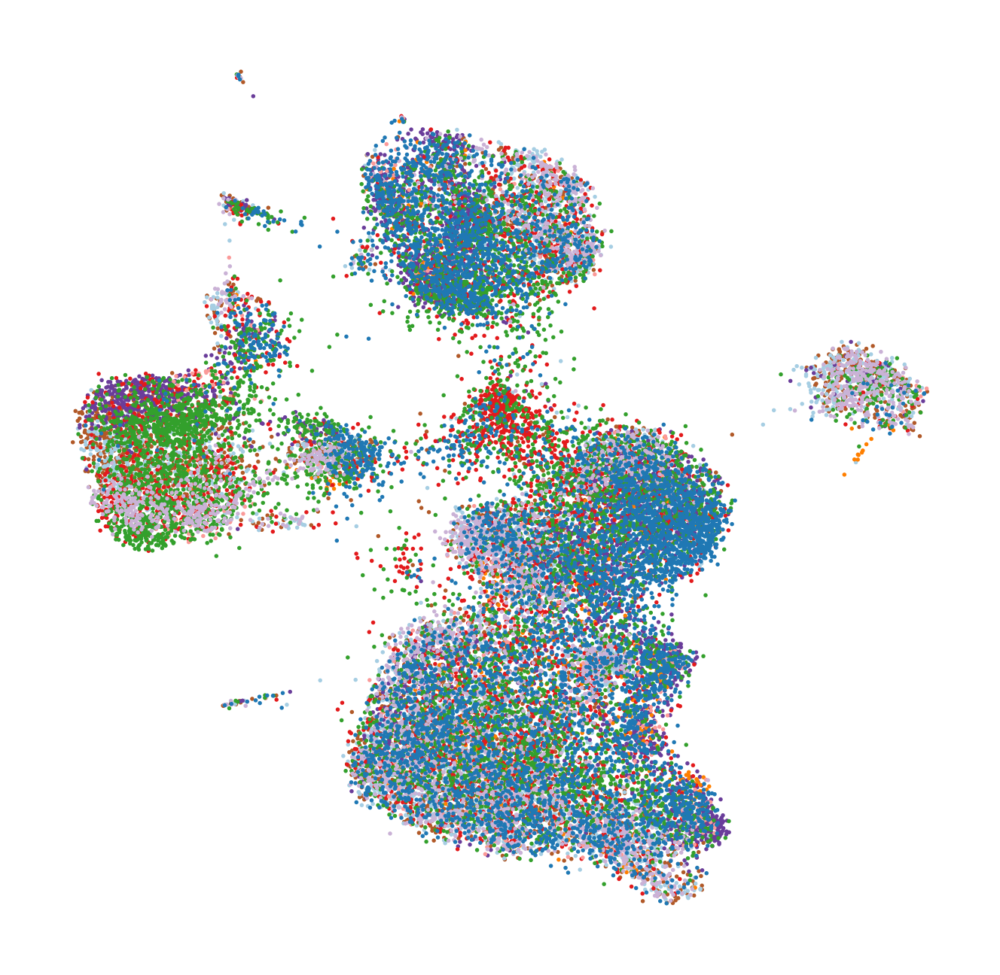

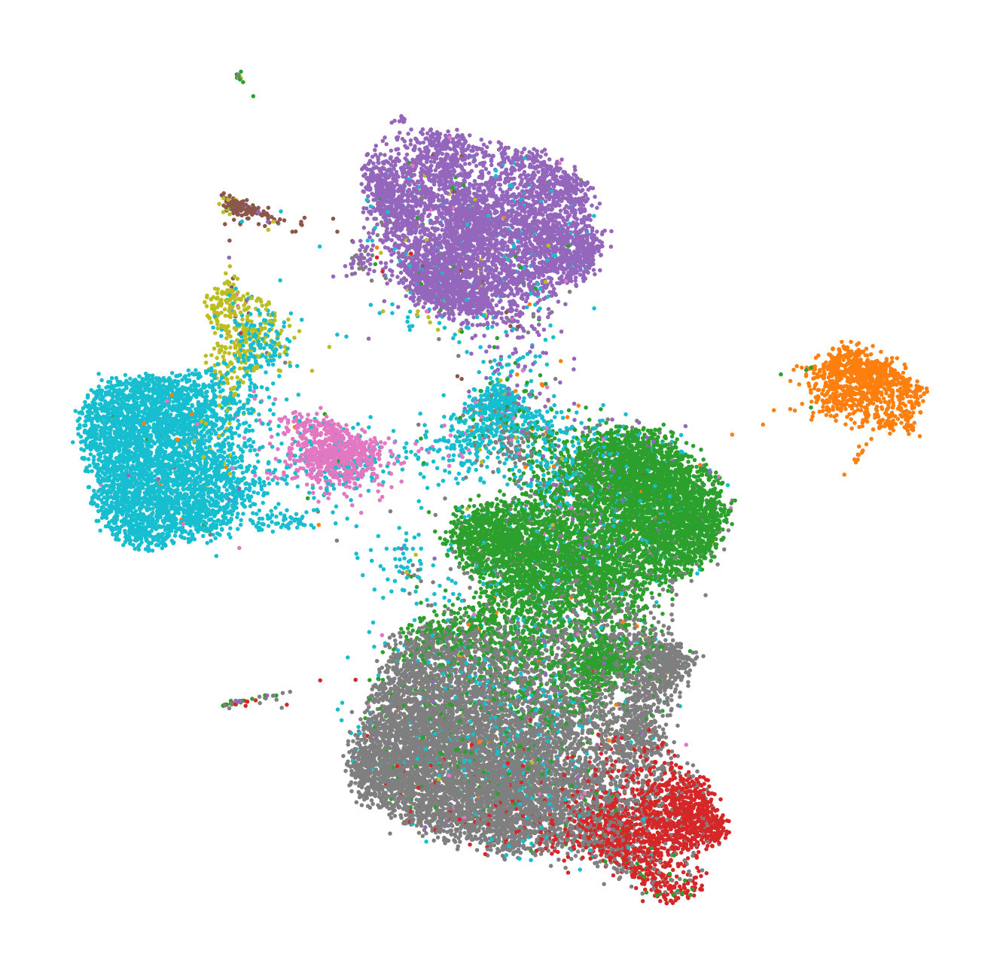

In [203]:
for i in range(6):
    plot_results(
        i, "pbmc_generalization",
        keys=['study', 'cell_type'],
        #batches_to_exclude = ["Drop-seq", "10x Chromium (v3)"],
        frameon=False,
        title="",
        legend_loc=False)